In [1]:
import os
import hydra
from omegaconf import DictConfig, OmegaConf

os.environ['XLA_PYTHON_CLIENT_MEM_FRACTION'] = ".30"
import wandb
import jax
import jax.numpy as jnp
import numpy as np

from jax import device_put, lax
jnp.arange(0, 100)  # Start jax before loading torch, otherwise my setup fails
import torch
# from al4pde.utils import set_current_seed
from al4pde.tasks.solver_utils import Courant, Courant_diff, bc, limiting
from al4pde.tasks.sim.sim import Simulator
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
from jax.lib import xla_bridge

print(device)

print("jax_dev", xla_bridge.get_backend().platform, flush=True)



cuda
jax_dev gpu


In [13]:
from hydra import initialize, compose
from omegaconf import OmegaConf

# Initialize Hydra
with initialize(config_path="config/task", version_base=None):  # Set version_base=None for compatibility
    # Compose the configuration
    cfg = compose(config_name="2d_ns_rand")  # Replace "config" with the name of your config file (without extension)

# Now you can access the configuration
print(OmegaConf.to_yaml(cfg))

_target_: al4pde.tasks.task.Task
data_path: data/data
run_save_path: data/runs
reduced_batch: 1
reduced_resolution: 2
reduced_resolution_t: 1
initial_step: 1
skip_initial_steps: 0
use_test: false
data_gen:
  num_test_batches: 256
  num_initial_batches: 8
  batch_size: 16
ic_gen:
  _target_: al4pde.tasks.ic_gen.ic_gen_2d_ns_rand.ICGenNSRand
  k_tot: 4
  xL: 0.0
  xR: 1.0
  yL: 0.0
  yR: 1.0
  zL: 0.0
  zR: 1.0
  nx: 128
  ny: 128
  nz: 1
  mach_min: 0.1
  mach_max: 1.0
  gamma: 1.6666666666666667
  d0Min: 0.1
  d0Max: 10.0
  T0Min: 0.1
  T0Max: 10.0
  init_field_type: rand
  constrain_max: true
  delDMin: 0.013
  delDMax: 0.26
  delPMin: 0.04
  delPMax: 0.8
param_gen:
  _target_: al4pde.tasks.param_gen.PDEParamGenerator
  min_val:
  - 0.0001
  - 0.0001
  max_val:
  - 0.1
  - 0.1
  log_scale:
  - true
  - true
sim:
  _target_: al4pde.tasks.sim.cfd.CFDSim
  pde_name: CFD_2D_Rand_S
  same_eta_zeta: false
  spatial_dim: 2
  ini_time: 0.0
  fin_time: 1.0
  dt: 0.05
  CFL: 0.3
  show_steps: 1

/mnt/home/gko/.conda/envs/al4pde/lib/python3.10/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In '2d_ns_rand': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)


In [16]:
cfg.keys()

dict_keys(['_target_', 'data_path', 'run_save_path', 'reduced_batch', 'reduced_resolution', 'reduced_resolution_t', 'initial_step', 'skip_initial_steps', 'use_test', 'data_gen', 'ic_gen', 'param_gen', 'sim'])

In [17]:
for key, value in cfg.items():
    print(f"Variable Name: {key}")
    print(f"Type: {type(value)}")
    print(f"Value: {value}")
    print()


Variable Name: _target_
Type: <class 'str'>
Value: al4pde.tasks.task.Task

Variable Name: data_path
Type: <class 'str'>
Value: data/data

Variable Name: run_save_path
Type: <class 'str'>
Value: data/runs

Variable Name: reduced_batch
Type: <class 'int'>
Value: 1

Variable Name: reduced_resolution
Type: <class 'int'>
Value: 2

Variable Name: reduced_resolution_t
Type: <class 'int'>
Value: 1

Variable Name: initial_step
Type: <class 'int'>
Value: 1

Variable Name: skip_initial_steps
Type: <class 'int'>
Value: 0

Variable Name: use_test
Type: <class 'bool'>
Value: False

Variable Name: data_gen
Type: <class 'omegaconf.dictconfig.DictConfig'>
Value: {'num_test_batches': 256, 'num_initial_batches': 8, 'batch_size': 16}

Variable Name: ic_gen
Type: <class 'omegaconf.dictconfig.DictConfig'>
Value: {'_target_': 'al4pde.tasks.ic_gen.ic_gen_2d_ns_rand.ICGenNSRand', 'k_tot': 4, 'xL': 0.0, 'xR': 1.0, 'yL': 0.0, 'yR': 1.0, 'zL': 0.0, 'zR': 1.0, 'nx': 128, 'ny': 128, 'nz': 1, 'mach_min': 0.1, 'mach_

In [34]:
cfg.ic_gen.nx = 32
cfg.ic_gen.ny = 32

ic_gen = hydra.utils.instantiate(cfg.ic_gen)
param_gen = hydra.utils.instantiate(cfg.param_gen)
sim = hydra.utils.instantiate(cfg.sim)


In [35]:
batch_size = 32

pde_params_normed = param_gen.get_normed_pde_params(batch_size)
pde_params = param_gen.get_pde_params(pde_params_normed)

ic_params = ic_gen.initialize_ic_params(batch_size)
ic = ic_gen.generate_initial_conditions(ic_params, pde_params)
grid = ic_gen.get_grid(1)[0]
u_trajectories_32, u_grid_coordsm, _ = sim(ic, pde_params,grid)

number of ICs to be evolved: 32
compiling jax sim
total elapsed time is 1.310293436050415 sec
total time for simulating 32 samples is 14.364311695098877 secs


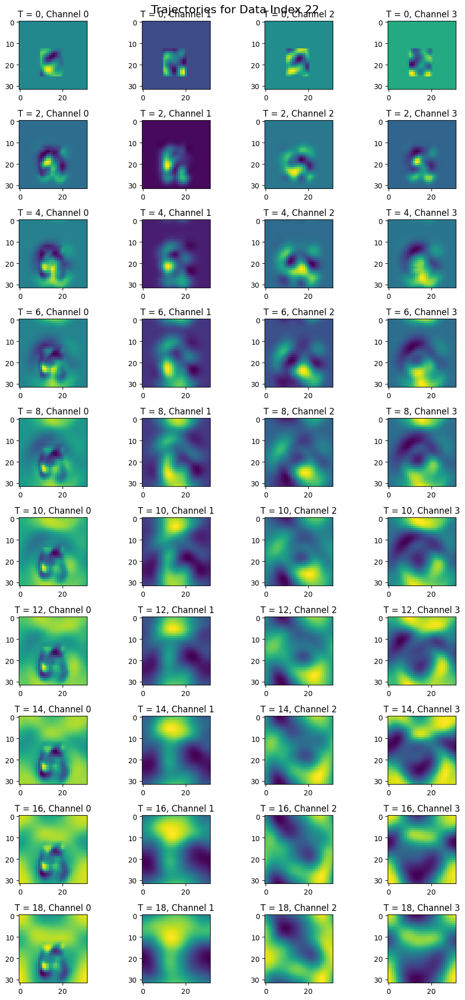

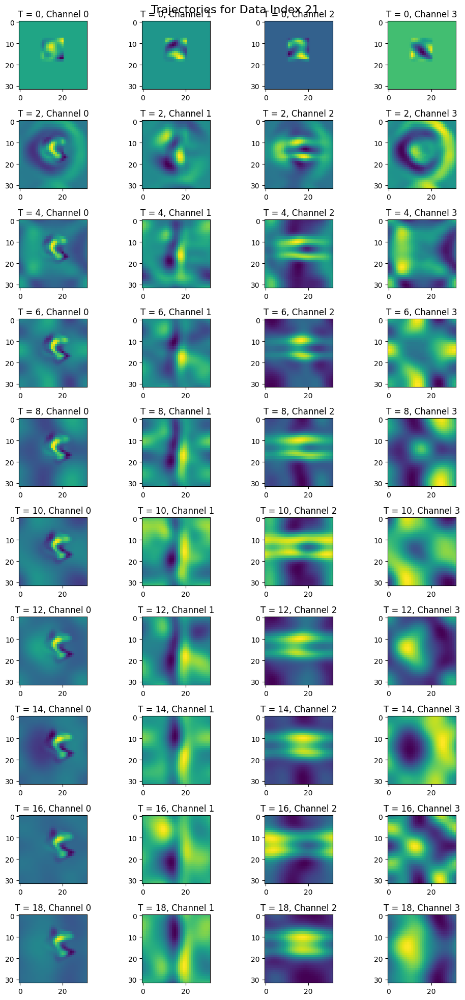

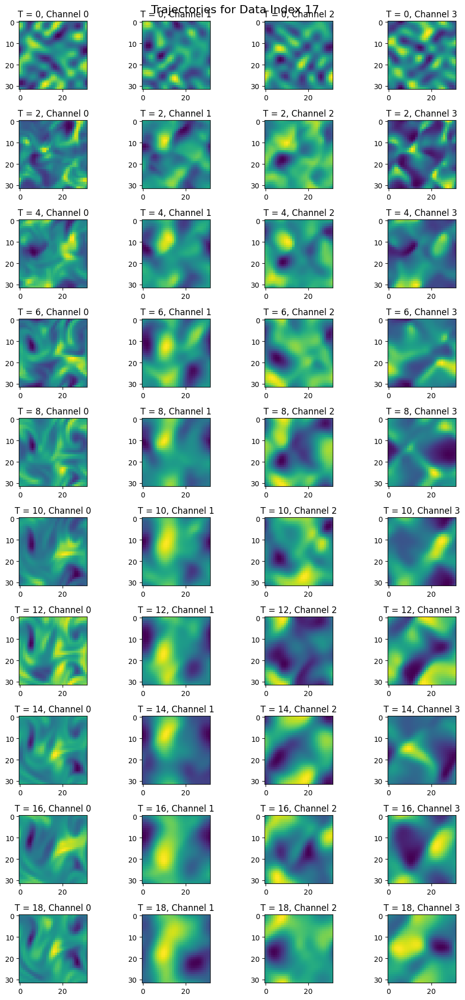

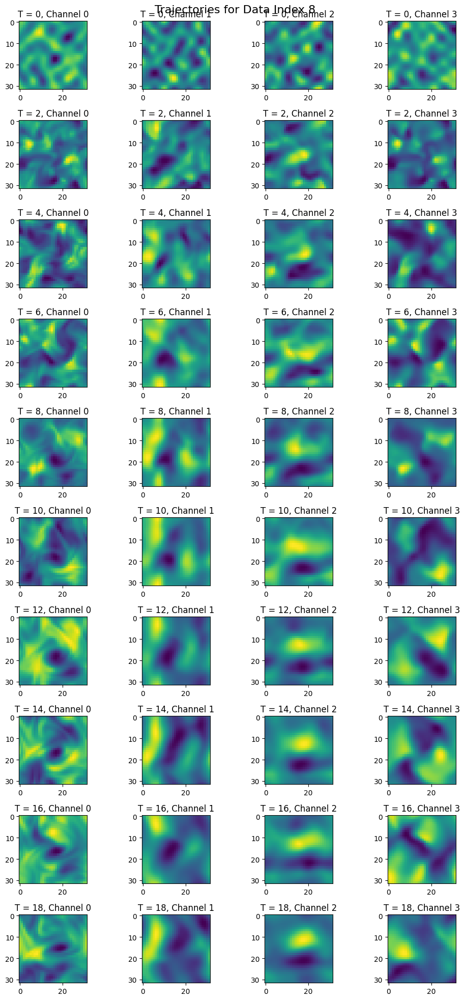

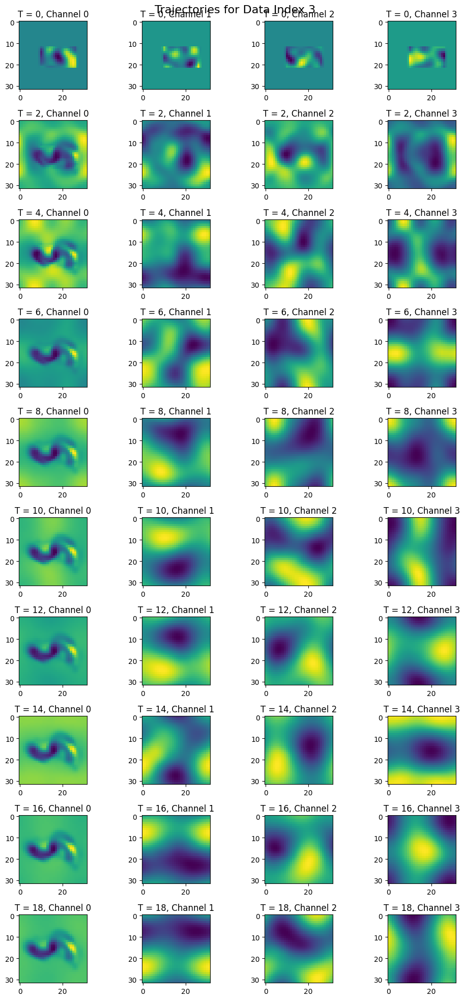

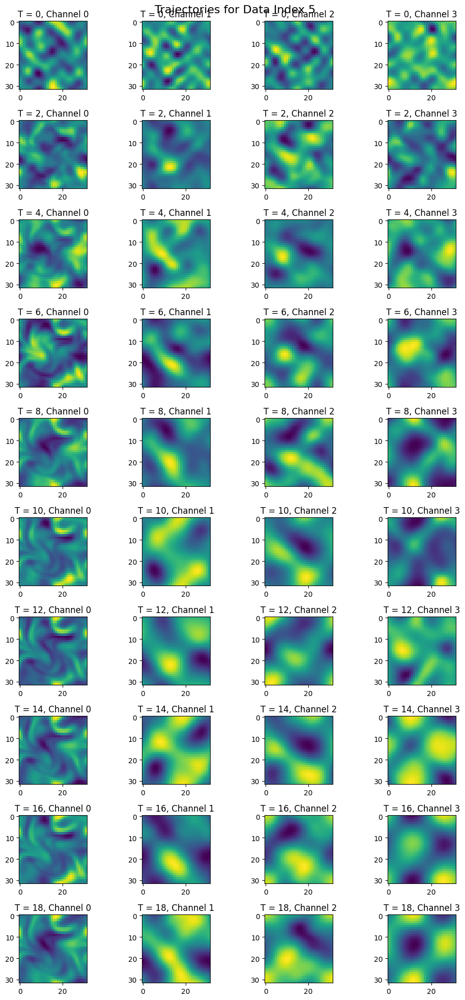

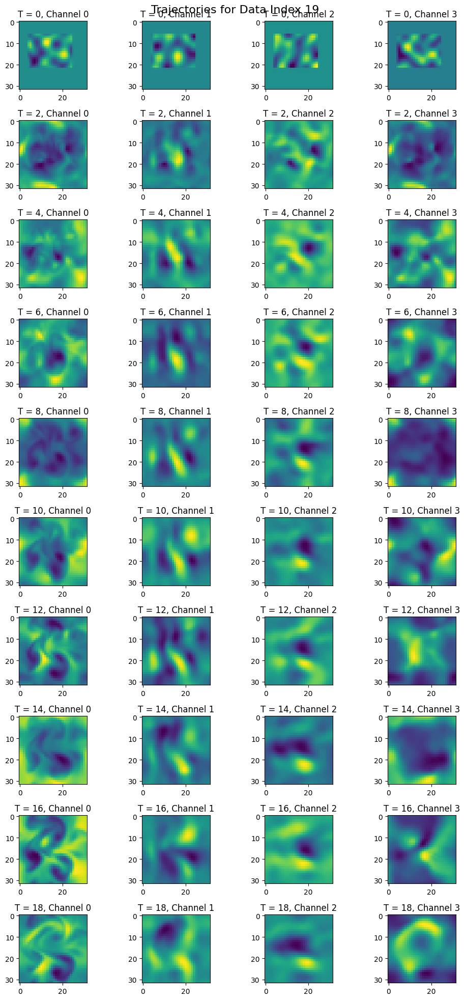

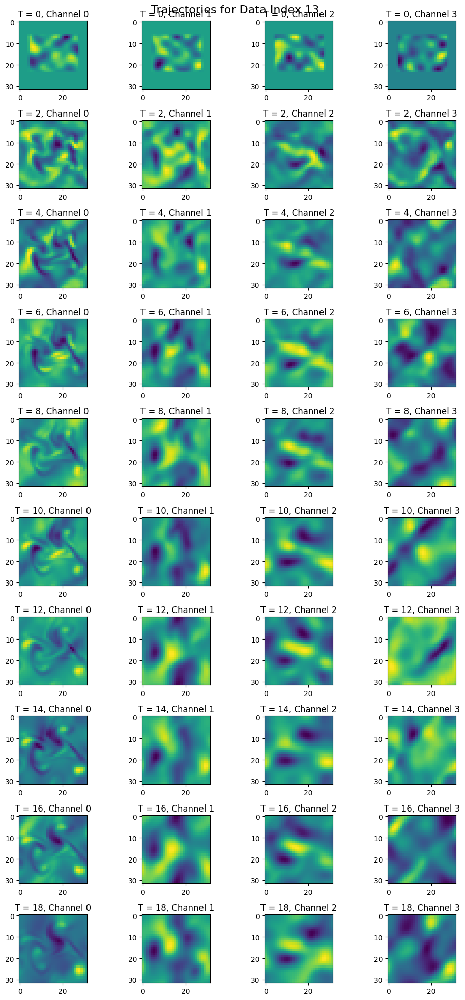

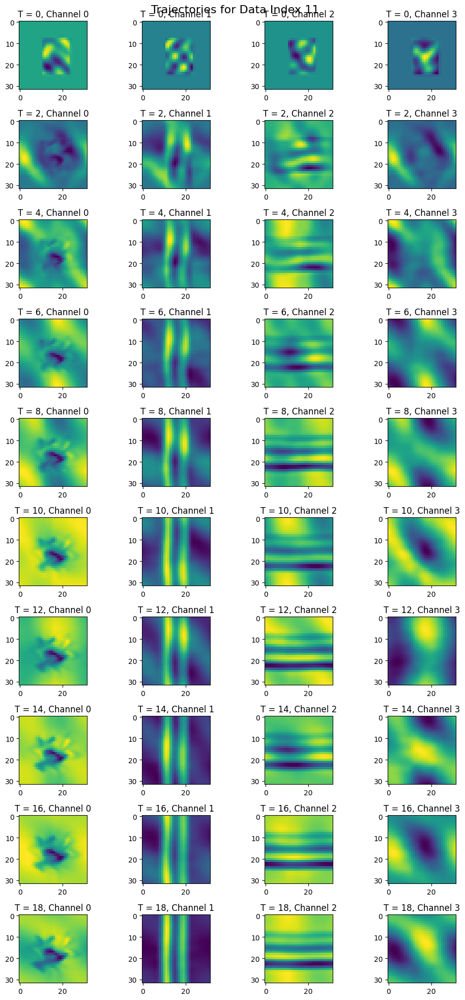

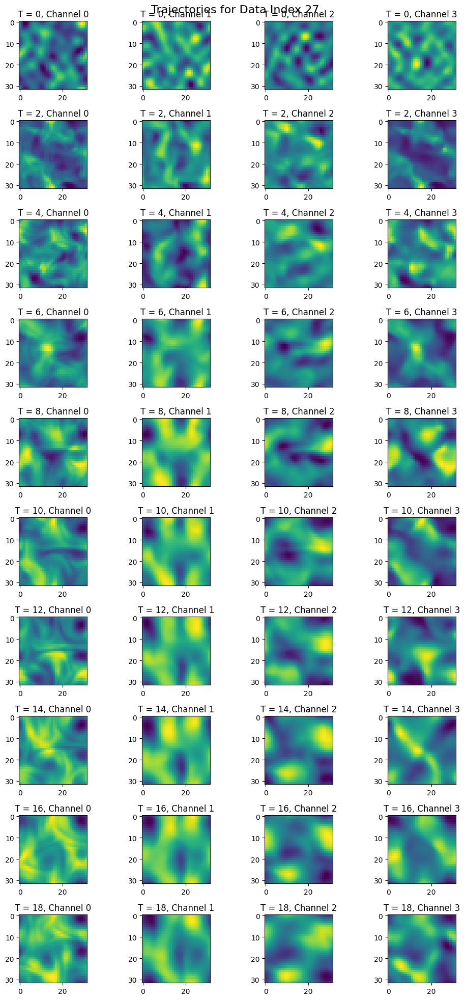

In [37]:
import matplotlib.pyplot as plt

for _ in range(10):
    # Randomly select an index from 0 to 32
    data_idx = np.random.randint(0, 32)

    # Define the timesteps
    timesteps = np.arange(0, 20, 2)

    # Create subplots for each channel
    fig, axs = plt.subplots(10, 4, figsize=(10, 20))

    # Plot trajectories for each channel
    for timestep in np.arange(0,20,2):
        for channel in range(4):
            # Get the trajectories for the selected index and timesteps
            trajectories = u_trajectories_32[data_idx, timestep, :, :, channel]

            # Plot the trajectories using imshow
            axs[timestep//2, channel].imshow(trajectories)

            # Set the title for each subplot
            axs[timestep//2, channel].set_title(f'T = {timestep}, Channel {channel}')

    # Set the overall title for the figure
    fig.suptitle(f'Trajectories for Data Index {data_idx}', fontsize=16)
    fig.tight_layout()
    # Show the plot
    plt.show()


In [23]:
batch_size = 32

pde_params_normed = param_gen.get_normed_pde_params(batch_size)
pde_params = param_gen.get_pde_params(pde_params_normed)

ic_params = ic_gen.initialize_ic_params(batch_size)
ic = ic_gen.generate_initial_conditions(ic_params, pde_params)
grid = ic_gen.get_grid(1)[0]
u_trajectories, u_grid_coordsm, _ = sim(ic, pde_params,grid)

number of ICs to be evolved: 32
compiling jax sim
total elapsed time is 1.2052080631256104 sec
total time for simulating 32 samples is 320.7606785297394 secs


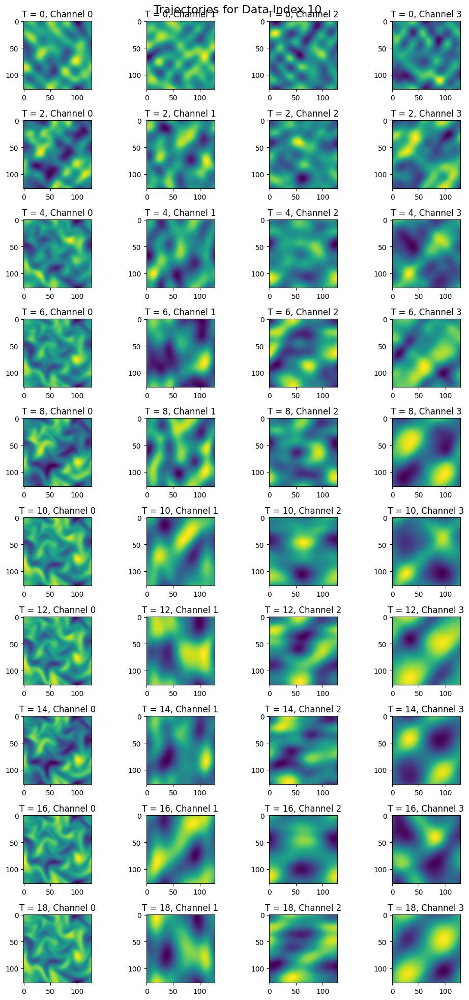

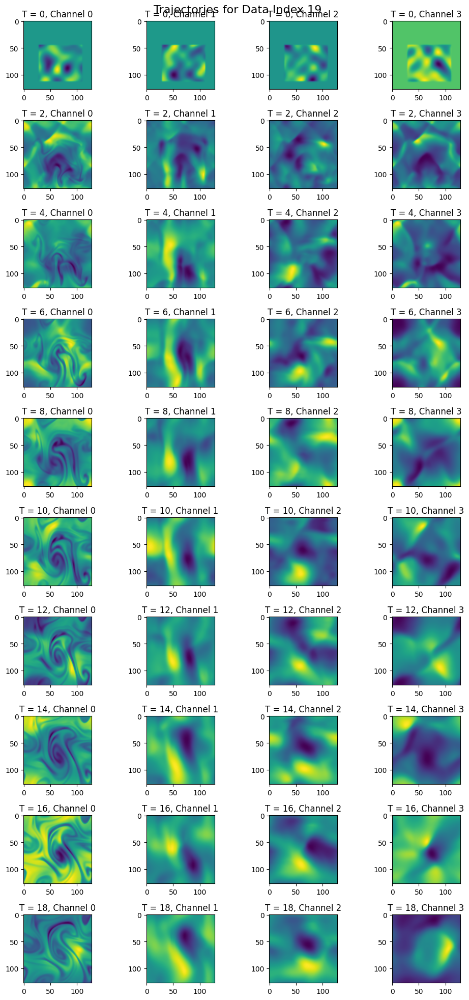

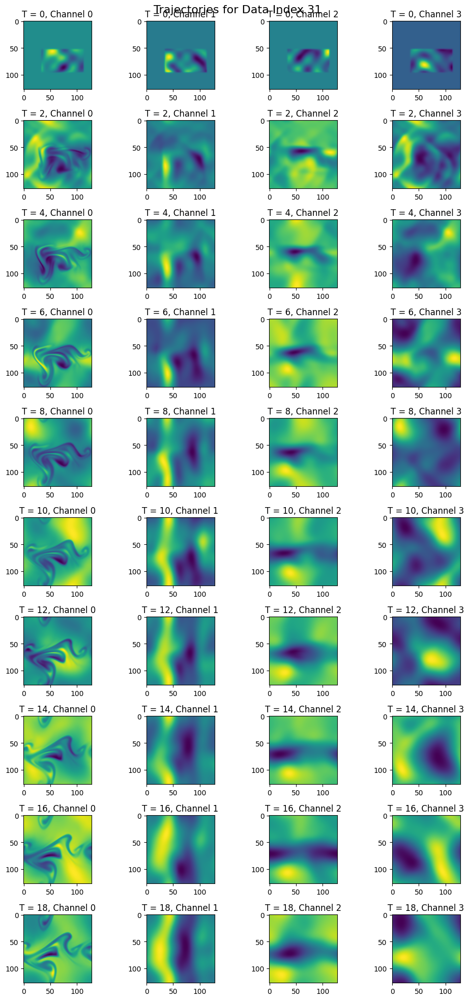

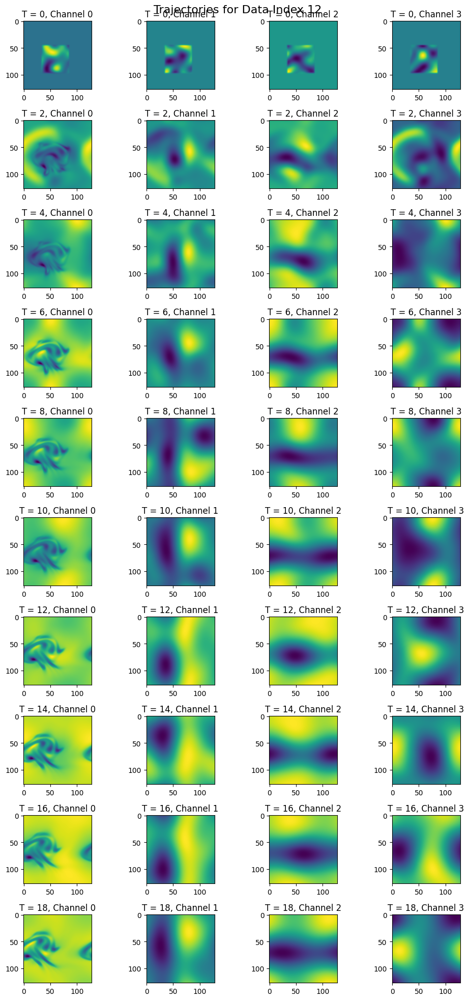

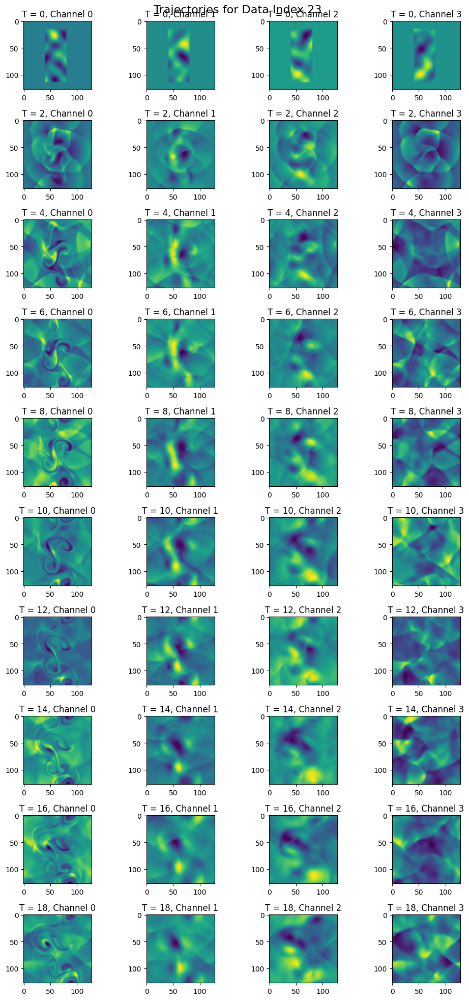

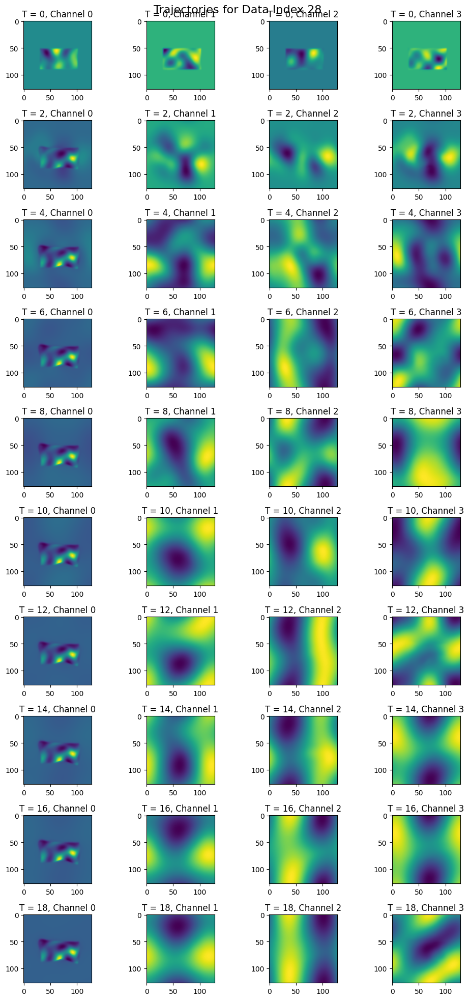

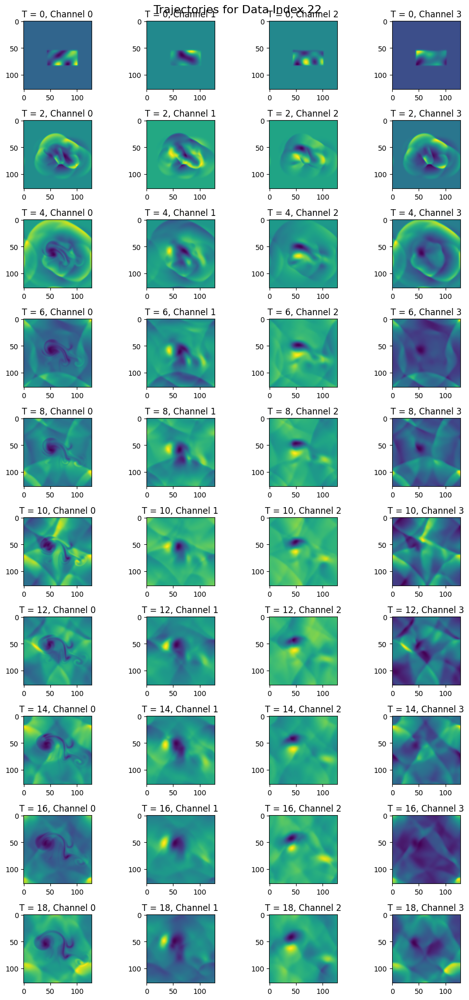

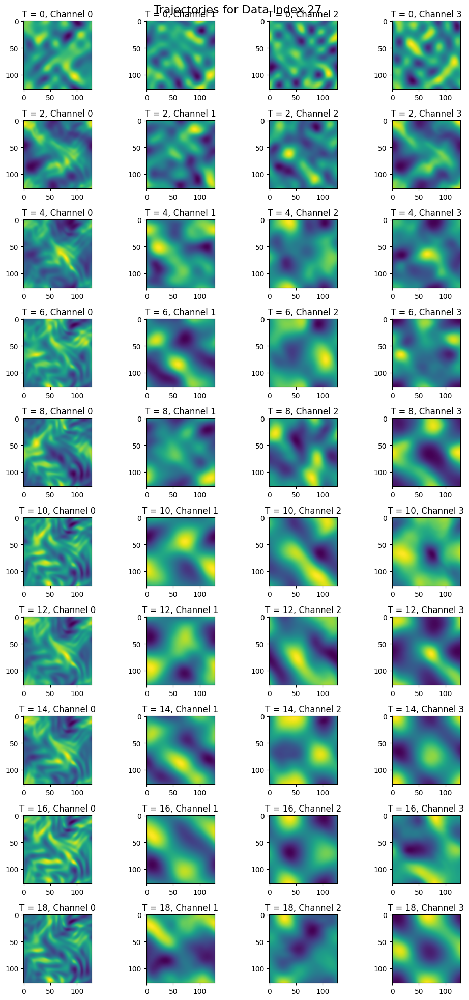

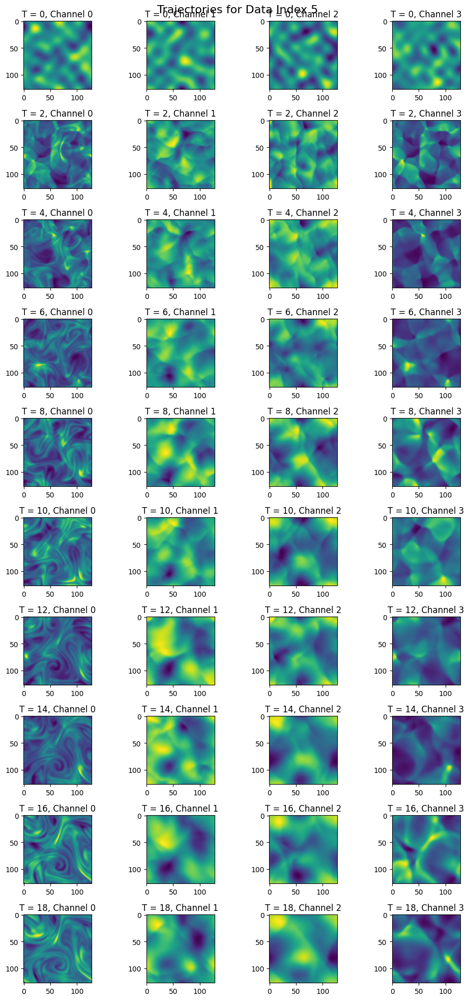

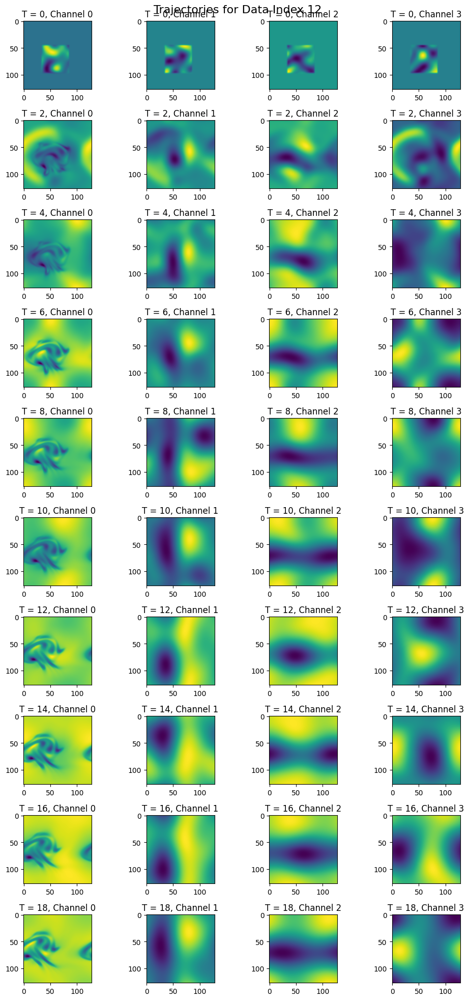

In [38]:
import matplotlib.pyplot as plt

for _ in range(10):
    # Randomly select an index from 0 to 32
    data_idx = np.random.randint(0, 32)

    # Define the timesteps
    timesteps = np.arange(0, 20, 2)

    # Create subplots for each channel
    fig, axs = plt.subplots(10, 4, figsize=(10, 20))

    # Plot trajectories for each channel
    for timestep in np.arange(0,20,2):
        for channel in range(4):
            # Get the trajectories for the selected index and timesteps
            trajectories = u_trajectories[data_idx, timestep, :, :, channel]

            # Plot the trajectories using imshow
            axs[timestep//2, channel].imshow(trajectories)

            # Set the title for each subplot
            axs[timestep//2, channel].set_title(f'T = {timestep}, Channel {channel}')

    # Set the overall title for the figure
    fig.suptitle(f'Trajectories for Data Index {data_idx}', fontsize=16)
    fig.tight_layout()
    # Show the plot
    plt.show()


In [26]:
u_trajectories, u_grid_coordsm, _ = sim(ic, pde_params,grid)

number of ICs to be evolved: 32
total time for simulating 32 samples is 314.07537746429443 secs


In [25]:
u_trajectories.shape

torch.Size([32, 21, 128, 128, 4])

In [8]:
import torch
import jax
import jax.numpy as jnp
from jax import device_put, lax
import numpy as np
from al4pde.tasks.solver_utils import Courant, Courant_diff, bc, limiting
from al4pde.tasks.sim.sim import Simulator
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


class BurgersSim(Simulator):
    """Evolve the initial conditions for the pde to get the full trajectory."""

    def __init__(self, ini_time, dt, CFL, show_steps, if_norm, if_second_order, pde_name="Burgers"):
        fin_time = dt
        super().__init__(pde_name, 1, 1, 1, dt, ini_time, fin_time)
        self.pde_param_names = "Nu"
        self.CFL = CFL
        self.show_steps = show_steps
        self.if_norm = if_norm
        self.if_second_order = if_second_order
        # self.traj_data_path = traj_data_path
        self.sim_fun = None

    def __call__(self, ic, pde_params, grid, nt):
        ic = jnp.array(ic.detach().cpu().numpy().squeeze())
        pde_params = jnp.array(pde_params.detach().cpu().numpy().squeeze())
        grid = jnp.array(grid.detach().cpu().numpy().squeeze())

        uu_traj, uu_xc, = self.evolve_ic_jax(ic, pde_params, grid, nt)
        uu_traj = torch.from_numpy(np.array(uu_traj))
        uu_xc = torch.from_numpy(np.array(uu_xc))
        return uu_traj, uu_xc
    def build_jax_sim(self, grid):
        pi_inv = 1. / jnp.pi
        dx = grid[1] - grid[0]
        dx_inv = 1. / dx
        nx = len(grid)
        ini_time = float(self.ini_time)
        # changed
        it_tot = 2
        fin_time = self.dt

        def _pass(carry):
            return carry

        @jax.jit
        def evolve(carry):
            print("compiling jax sim")
            u, pde_param = carry
            t = ini_time
            tsave = t
            steps = 0
            i_save = 0
            dt = 0.
            uu = jnp.zeros([it_tot, u.shape[0]])
            uu = uu.at[0].set(u)

            cond_fun = lambda x: x[0] < fin_time

            def _body_fun(carry):
                def _show(_carry):
                    u, tsave, i_save, uu = _carry
                    uu = uu.at[i_save].set(u)
                    tsave += self.dt
                    i_save += 1
                    return (u, tsave, i_save, uu)

                t, tsave, steps, i_save, dt, u, uu, pde_param = carry

                carry = (u, tsave, i_save, uu)
                u, tsave, i_save, uu = lax.cond(t >= tsave, _show, _pass, carry)

                carry = (u, t, dt, steps, tsave, pde_param)
                u, t, dt, steps, tsave, params = lax.fori_loop(0, self.show_steps, simulation_fn, carry)

                return (t, tsave, steps, i_save, dt, u, uu, pde_param)

            carry = t, tsave, steps, i_save, dt, u, uu, pde_param
            t, tsave, steps, i_save, dt, u, uu, pde_param = lax.while_loop(cond_fun, _body_fun, carry)
            uu = uu.at[-1].set(u)

            return u

        @jax.jit
        def simulation_fn(i, carry):
            u, t, dt, steps, tsave, pde_param_epsilon = carry
            dt_adv = Courant(u, dx) * self.CFL
            dt_dif = Courant_diff(dx, pde_param_epsilon * pi_inv) * self.CFL
            dt = jnp.min(jnp.array([dt_adv, dt_dif, fin_time - t, tsave - t]))

            def _update(carry):
                u, dt, pde_param_epsilon = carry
                # preditor step for calculating t+dt/2-th time step
                u_tmp = update(u, u, dt * 0.5, pde_param_epsilon)
                # update using flux at t+dt/2-th time step
                u = update(u, u_tmp, dt, pde_param_epsilon)
                return u, dt, pde_param_epsilon

            carry = u, dt, pde_param_epsilon
            u, dt, pde_param_epsilon = lax.cond(dt > 1.e-8, _update, _pass, carry)
            t += dt
            steps += 1
            return u, t, dt, steps, tsave, pde_param_epsilon

        @jax.jit
        def update(u, u_tmp, dt, pde_param_epsilon):
            f = flux(u_tmp, pde_param_epsilon)
            u -= dt * dx_inv * (f[1:nx + 1] - f[0:nx])
            return u

        def flux(u, pde_param_epsilon):
            _u = bc(u, dx, Ncell=nx)  # index 2 for _U is equivalent with index 0 for u
            uL, uR = limiting(_u, nx, if_second_order=1.)
            fL = 0.5 * uL ** 2
            fR = 0.5 * uR ** 2
            # upwind advection scheme
            f_upwd = 0.5 * (fR[1:nx + 2] + fL[2:nx + 3]
                            - 0.5 * jnp.abs(uL[2:nx + 3] + uR[1:nx + 2]) * (uL[2:nx + 3] - uR[1:nx + 2]))
            # source term
            f_upwd += - pde_param_epsilon * pi_inv * (_u[2:nx + 3] - _u[1:nx + 2]) * dx_inv
            return f_upwd

        return jax.pmap(jax.vmap(evolve, axis_name='j'), axis_name='i')

    def evolve_ic_jax(self, ic_u, pde_param, grid, nt):
        # basic parameters
        xc = grid
        num_init_conds = ic_u.shape[0]
        print(f"number of ICs to be processed: {num_init_conds}")

        if self.sim_fun is None:
            self.sim_fun = self.build_jax_sim(grid)

        # entry point
        # this is the point of entry to call the solver to evolve the initial condition
        # which comes from the active learning variance maximation model
        # u_ic_active_learn = jnp.load('u_ic_active_learn.npy')
        # u = init_multi(xc, numbers=cfg.multi.numbers, k_tot=4, init_key=cfg.multi.init_key)
        u = ic_u
        u = device_put(u)  # putting variables in GPU (not necessary??)
        pde_param = device_put(pde_param)
        # print(f"num samples requested: {numbers}")

        local_devices = jax.local_device_count()
        u = u.reshape([local_devices, num_init_conds // local_devices, -1])   # @kmario23: reshapes the traj tensor accord. to the number of devices
        pde_param = pde_param.reshape([local_devices, num_init_conds // local_devices])
        u_trajectories = [u.reshape(num_init_conds, -1, 1)]
        for i in range(nt-1):
            u = self.sim_fun((u, pde_param)).block_until_ready()
            u_trajectories.append(u.reshape(num_init_conds, -1, 1))
        uu = jnp.concatenate(u_trajectories, axis=1)
        uu = uu.reshape([num_init_conds, nt, -1, 1])
        return uu, xc



In [11]:
from al4pde.tasks.ic_gen.ic_gen_burgers import ICGenBurgers


sim = BurgersSim(
    ini_time=0.,
    dt=0.01,        
    CFL=0.25,       
    show_steps=100,
    if_norm=False, 
    if_second_order=1.,
)
ic_gen = ICGenBurgers(
    k_tot = 4,
    num_choice_k = 2,
    xL = 0.,
    xR = 1.,
    nx = 256,
)
batch_size = 2048


nu = 0.01
pde_params = torch.Tensor([[nu]]).repeat(batch_size, 1).to(device)


ic_params = ic_gen.initialize_ic_params(batch_size)
ic = ic_gen.generate_initial_conditions(ic_params, pde_params)
grid = ic_gen.get_grid(1)[0]
u_trajectories, u_grid_coords = sim(ic, pde_params,grid, nt=201)


number of ICs to be processed: 2048
compiling jax sim


Text(0, 0.5, 'T')

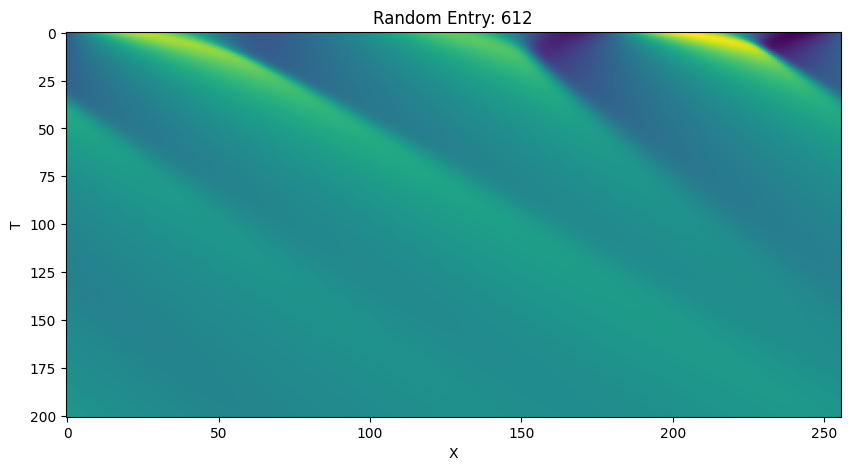

In [12]:
import numpy as np

import matplotlib.pyplot as plt

# Draw a random index for the first entry
first_entry_idx = np.random.randint(0, u_trajectories.shape[0])


fig, axes = plt.subplots(1, 1, figsize=(10, 5))
axes = [axes]  # Convert to list for consistency
# Plot the first entry
axes[0].imshow(u_trajectories[first_entry_idx, :, :, 0].cpu().numpy(), aspect='auto')
axes[0].set_title(f'Random Entry: {first_entry_idx}')
axes[0].set_xlabel('X')
axes[0].set_ylabel('T')



number of ICs to be processed: 128


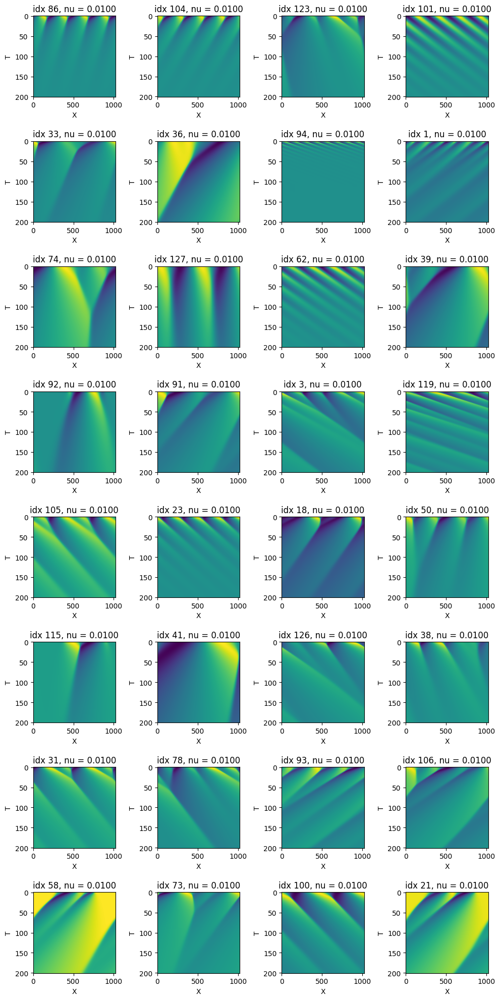

In [ ]:
ic_gen = hydra.utils.instantiate(cfg.task.ic_gen)
sim = hydra.utils.instantiate(cfg.task.sim)
batch_size = 128


nu = 0.01
pde_params = torch.Tensor([[nu]]).repeat(batch_size, 1).to(device)


ic_params = ic_gen.initialize_ic_params(batch_size)
ic = ic_gen.generate_initial_conditions(ic_params, pde_params)
u_trajectories, u_grid_coords, u_tcoords = task.evolve_ic(ic, pde_params)

import matplotlib.pyplot as plt

# Sort indices by pde_params in descending order
selected_indices = np.random.choice(range(batch_size), 32, replace=False)
# Plot the sorted results
fig, axes = plt.subplots(8, 4, figsize=(10, 20))
axes = axes.flatten()
for ax, idx in zip(axes, selected_indices):
    im = ax.imshow(u_trajectories[idx, :, :, 0].cpu().numpy(), aspect='auto')
    ax.set_title(f'idx {idx}, nu = {pde_params[idx, 0]:.4f}')
    ax.set_aspect(5, adjustable='box')  # Adjust the aspect ratio
    ax.set_xlabel('X')
    ax.set_ylabel('T')
    # fig.colorbar(im, ax=ax, orientation='horizontal', fraction=0.02, pad=0.04)
plt.tight_layout()
plt.show()


In [13]:
u_trajectories.shape

torch.Size([128, 201, 1024, 1])

In [32]:
ic_params

TensorDict(
    fields={
        amp: Tensor(shape=torch.Size([32, 4, 1]), device=cuda:0, dtype=torch.float32, is_shared=True),
        cond0: Tensor(shape=torch.Size([32]), device=cuda:0, dtype=torch.int64, is_shared=True),
        cond1: Tensor(shape=torch.Size([32]), device=cuda:0, dtype=torch.int64, is_shared=True),
        kk: Tensor(shape=torch.Size([32, 4]), device=cuda:0, dtype=torch.float32, is_shared=True),
        phs: Tensor(shape=torch.Size([32, 4, 1]), device=cuda:0, dtype=torch.float32, is_shared=True),
        sgn: Tensor(shape=torch.Size([32, 1]), device=cuda:0, dtype=torch.int64, is_shared=True),
        xL: Tensor(shape=torch.Size([32, 1]), device=cuda:0, dtype=torch.float32, is_shared=True),
        xR: Tensor(shape=torch.Size([32, 1]), device=cuda:0, dtype=torch.float32, is_shared=True)},
    batch_size=torch.Size([32]),
    device=None,
    is_shared=False)

In [31]:
pde_params.device

device(type='cuda', index=0)

In [ ]:
ic_params = task.get_ic_params(batch_size)
i
pde_params_normed = task.get_pde_params_normed(batch_size)
pde_params = task.get_pde_params(pde_params_normed)
ic = task.get_ic(ic_params, pde_params)
u_trajectories, u_grid_coords, u_tcoords = task.evolve_ic(ic, pde_params)

number of ICs to be processed: 32


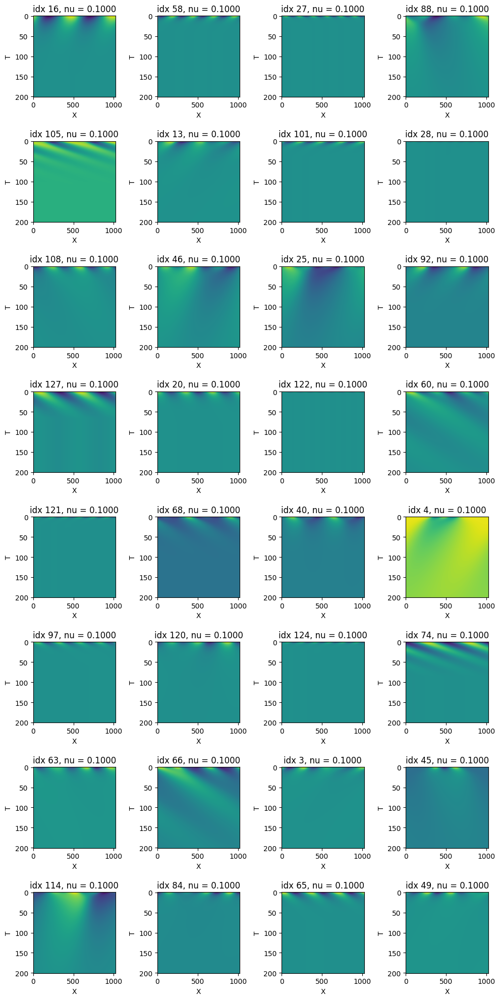

In [13]:
task

In [27]:
ic.shape

torch.Size([32, 1024, 1, 1])

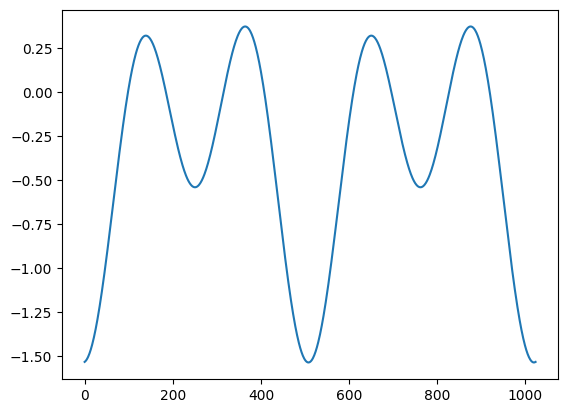

In [36]:
plt.plot(ic[17, :, 0, 0].detach().cpu().numpy())

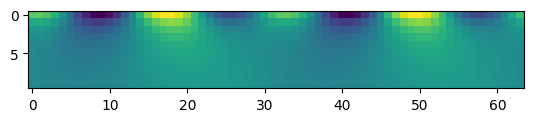

In [34]:
plt.imshow(u_trajectories[10, :10,range(0,1024,16),0].cpu().numpy())

In [23]:
pde_params

tensor([[0.0017],
        [0.0110],
        [0.1808],
        [0.0576],
        [0.0024],
        [0.2277],
        [0.0483],
        [0.2348],
        [0.0030],
        [0.0514],
        [0.7356],
        [0.0488],
        [0.0047],
        [0.2038],
        [0.2067],
        [0.0076],
        [0.0097],
        [0.8888],
        [0.9874],
        [0.3698],
        [0.0059],
        [0.0153],
        [0.9763],
        [0.0052],
        [0.0024],
        [0.0012],
        [0.1383],
        [0.0166],
        [0.0033],
        [0.3224],
        [0.0018],
        [0.0011]], device='cuda:0', grad_fn=<StackBackward0>)

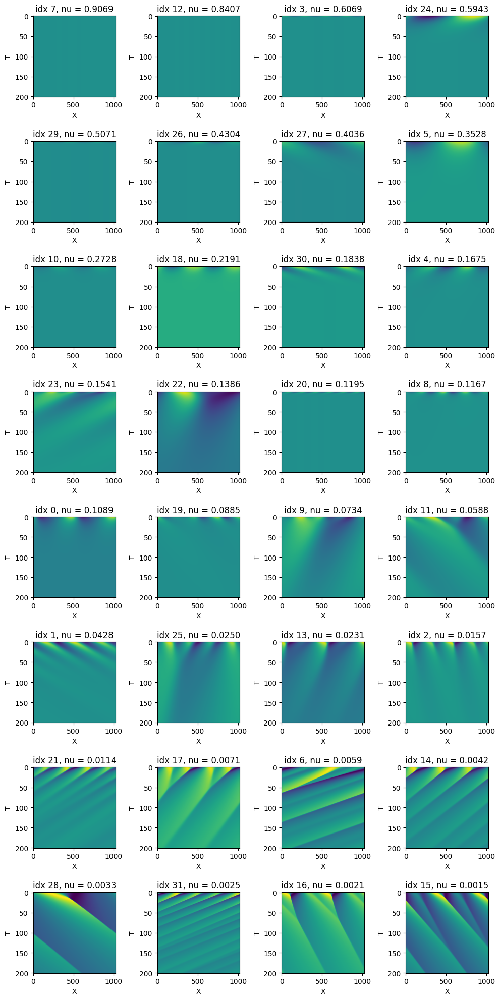

In [54]:
import matplotlib.pyplot as plt

# Sort indices by pde_params in descending order
sorted_indices = torch.argsort(pde_params[:,0], descending=True)

# Plot the sorted results
fig, axes = plt.subplots(8, 4, figsize=(10, 20))
axes = axes.flatten()
for ax, idx in zip(axes, sorted_indices):
    im = ax.imshow(u_trajectories[idx, :, :, 0].cpu().numpy(), aspect='auto')
    ax.set_title(f'idx {idx}, nu = {pde_params[idx, 0]:.4f}')
    ax.set_aspect(5, adjustable='box')  # Adjust the aspect ratio
    ax.set_xlabel('X')
    ax.set_ylabel('T')
    # fig.colorbar(im, ax=ax, orientation='horizontal', fraction=0.02, pad=0.04)
plt.tight_layout()
plt.show()
# for idx in sorted_indices:
#     plt.figure(figsize=(10, 3))
#     plt.imshow(u_trajectories[idx, :, :, 0].cpu().numpy(), aspect='auto')
#     plt.colorbar()
#     plt.title(f'idx {idx}, nu = {pde_params[idx, 0]:.2f}')
#     plt.gca().set_aspect(5, adjustable='box')  # Adjust the aspect ratio
#     plt.xlabel('X')
#     plt.ylabel('T')
#     plt.show()

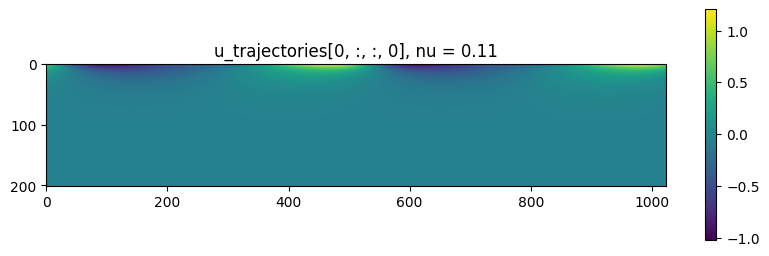

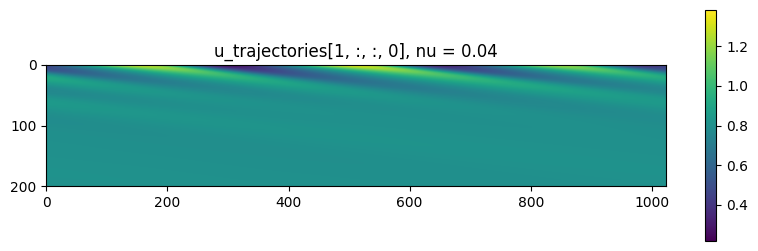

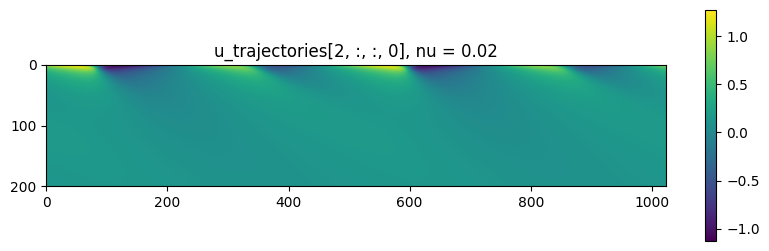

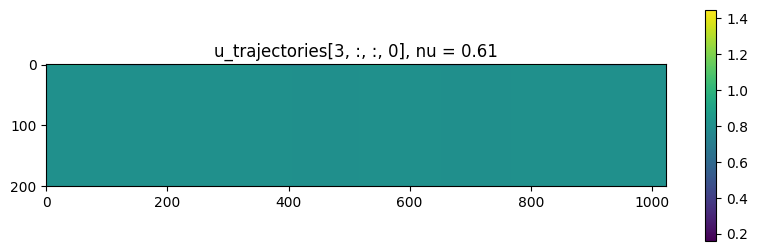

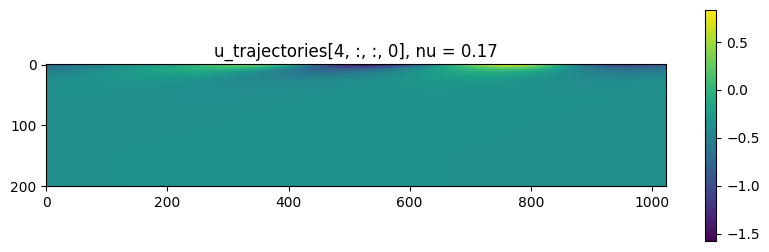

...

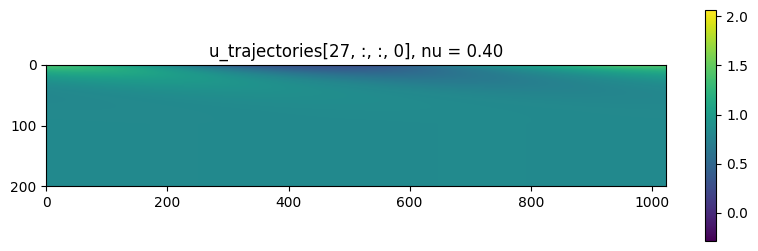

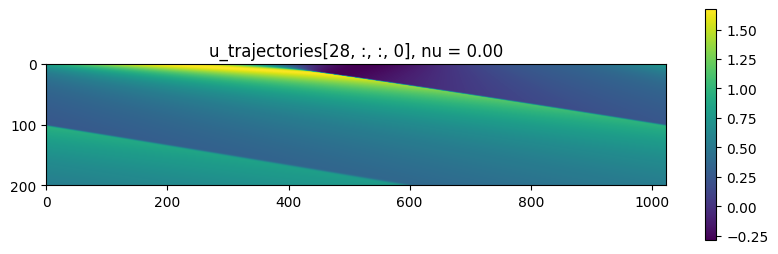

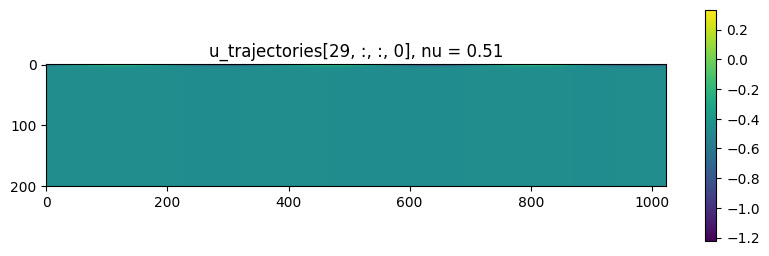

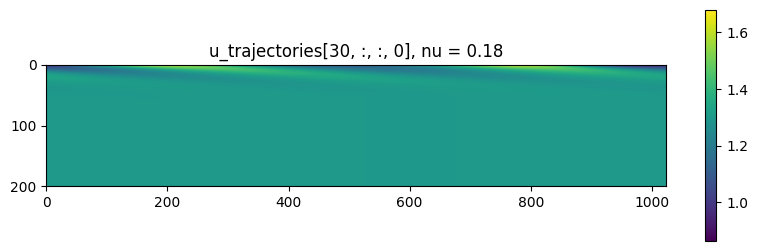

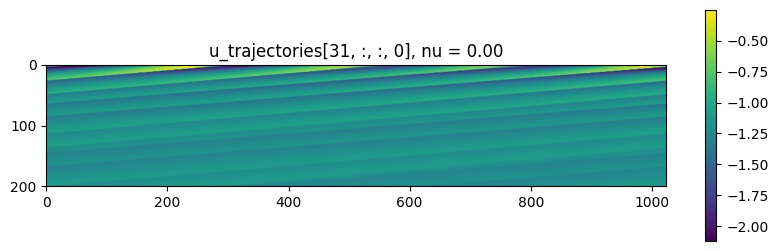

In [41]:
u_trajectories.shape
for i in range(32):
    plt.figure(figsize=(10, 3))
    plt.imshow(u_trajectories[i, :, :, 0].cpu().numpy())
    plt.colorbar()
    plt.title(f'u_trajectories[{i}, :, :, 0], nu = {pde_params[i, 0]:.2f}')
    plt.show()
# import matplotlib.pyplot as plt
# plt.figure(figsize=(30, 10))
# plt.imshow(u_trajectories[10, :,:,0].cpu().numpy())
# plt.colorbar()

In [22]:
u_trajectories[20, :,:,0]

tensor([[-1.9031, -1.9359, -1.9681,  ..., -1.8359, -1.8698, -1.9031],
        [-2.0134, -2.0226, -2.0310,  ..., -1.9808, -1.9925, -2.0033],
        [-1.8273, -1.8259, -1.8240,  ..., -1.8291, -1.8290, -1.8284],
        ...,
        [-1.4921, -1.4921, -1.4921,  ..., -1.4921, -1.4921, -1.4921],
        [-1.4921, -1.4921, -1.4921,  ..., -1.4921, -1.4921, -1.4921],
        [-1.4921, -1.4921, -1.4921,  ..., -1.4921, -1.4921, -1.4921]])

In [ ]:


os.makedirs(path, exist_ok=True)
for idx in range(num_batches):
    print(f"\ngenerating  batch {idx + 1}")
    ic_params = task.get_ic_params(batch_size)
    pde_params_normed = task.get_pde_params_normed(batch_size)
    pde_params = task.get_pde_params(pde_params_normed)
    ic = task.get_ic(ic_params, pde_params)
    u_trajectories, u_grid_coords, u_tcoords = task.evolve_ic(ic, pde_params)
    task.save_trajectories(u_trajectories, pde_params, u_grid_coords, u_tcoords, al_iter_id, idx, save_path=path,
                            ic_params=ic_params, pde_params_normed=pde_params_normed)